In [35]:
import numpy as np
import pandas as pd
import seqlogo
import logomaker
import matplotlib.pyplot as plt



In [36]:
file_path = 'meme_file_multitask_TRASH_3L.txt'

In [37]:
motifs = []
current_motif = None
reading_matrix = False

In [38]:
def compute_information_content(pwm):
    # 背景分布概率，假设为均匀分布
    background_prob = 0.25
    # 计算每个位置的信息内容
    ic = pwm * np.log2(pwm / background_prob + 1e-9)  # 加上一个小数避免对0取对数
    return ic.sum(axis=1)

In [39]:
with open(file_path, 'r') as file:
    for line in file:
        # 新的motif开始
        if line.startswith('MOTIF'):
            # 如果之前有motif，先将其添加到列表
            if current_motif is not None:
                motifs.append(pd.DataFrame(current_motif))
            # 重置当前motif数据
            current_motif = {'A': [], 'C': [], 'G': [], 'T': []}
            reading_matrix = False  # 重置标志
        elif "letter-probability matrix" in line:
            # 遇到矩阵开始的标识符
            reading_matrix = True
        elif reading_matrix and line.strip():
            # 读取并添加PWM数据
            probs = line.strip().split()
            current_motif['A'].append(float(probs[0]))
            current_motif['C'].append(float(probs[1]))
            current_motif['G'].append(float(probs[2]))
            current_motif['T'].append(float(probs[3]))

In [40]:
if current_motif is not None:
    motifs.append(pd.DataFrame(current_motif))

In [41]:
motifs_ic = []
for motif_df in motifs:
    ic = compute_information_content(motif_df)
    motifs_ic.append(ic)

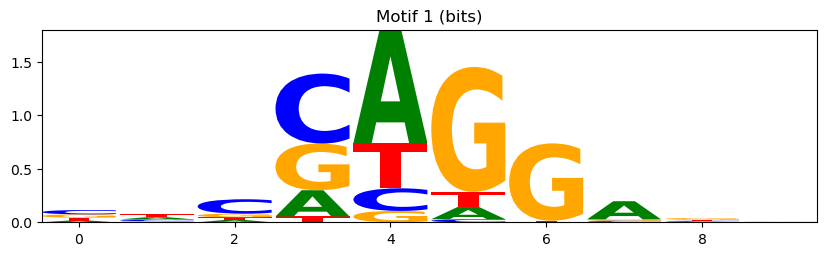

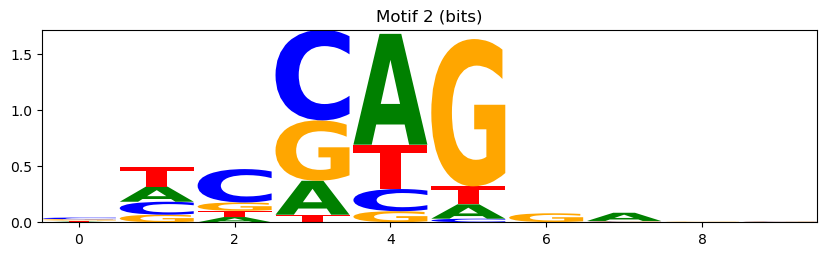

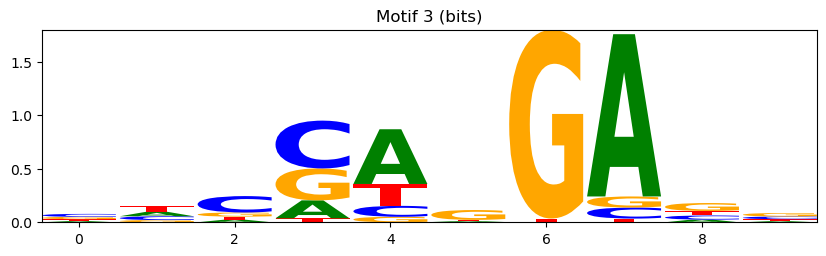

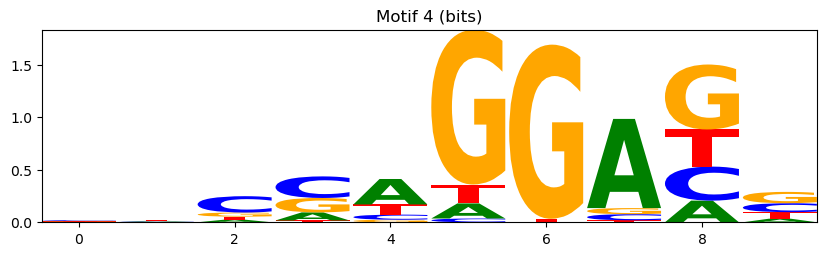

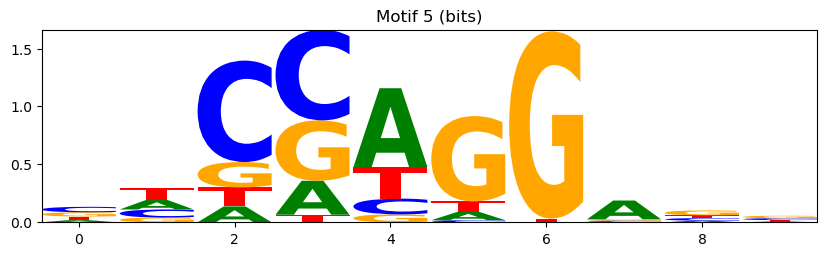

...

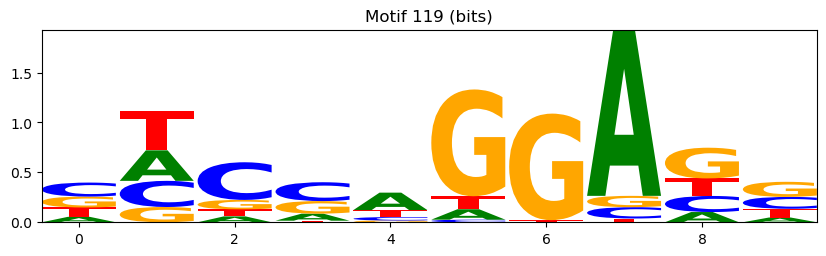

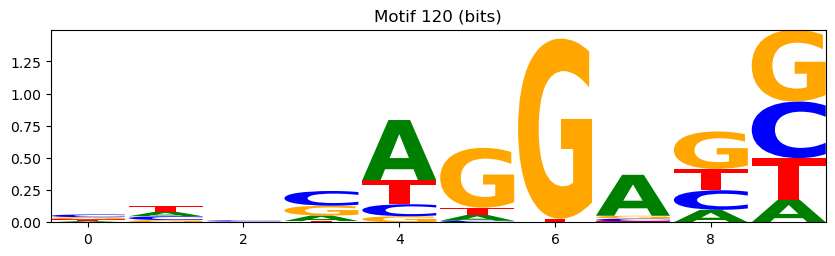

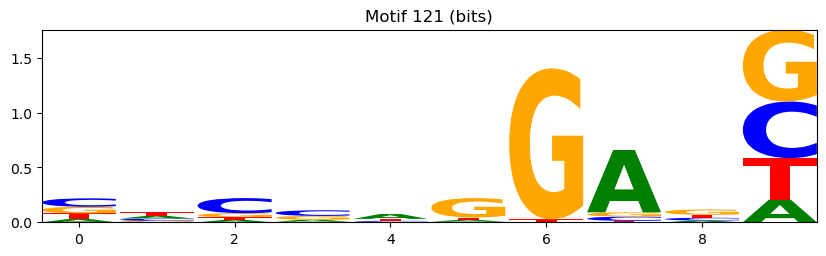

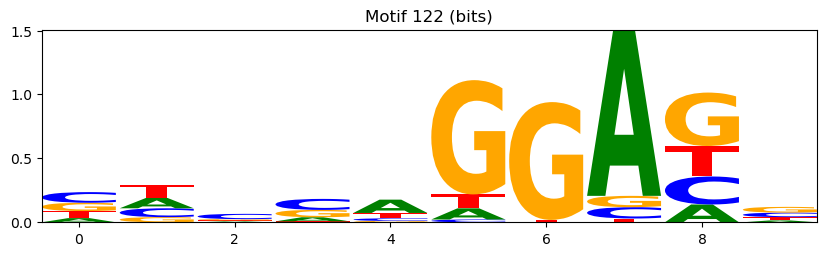

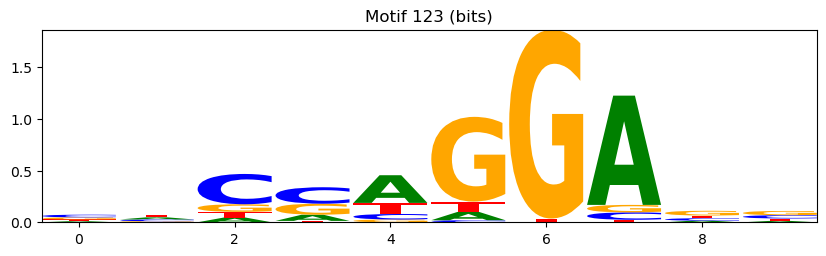

In [42]:
for i, motif_ic in enumerate(motifs_ic):
    # 创建一个空的DataFrame，用于存储信息内容数据
    ic_df = pd.DataFrame(index=range(len(motif_ic)), columns=['A', 'C', 'G', 'T'])
    for base in ['A', 'C', 'G', 'T']:
        ic_df[base] = motif_df[base] * motif_ic  # 按照信息内容加权

    logo = logomaker.Logo(ic_df, font_name='Arial', color_scheme='classic')
    plt.title(f'Motif {i+1} (bits)')
    plt.show()

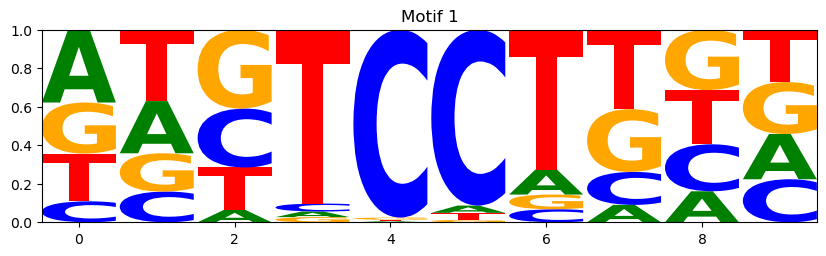

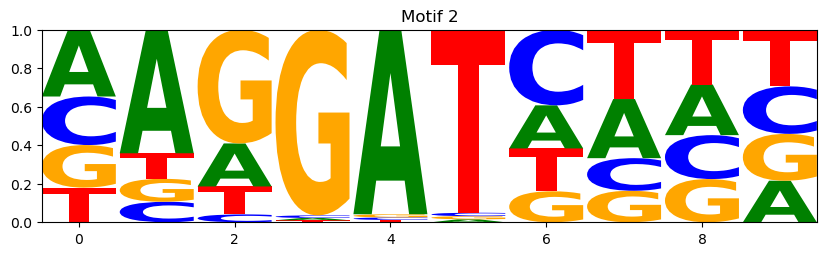

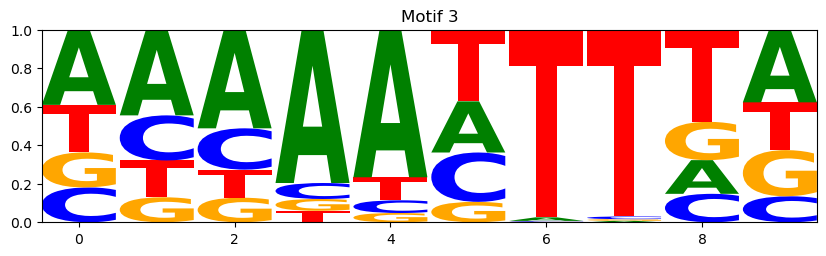

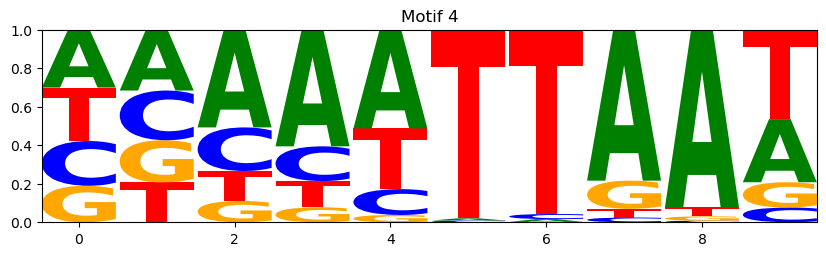

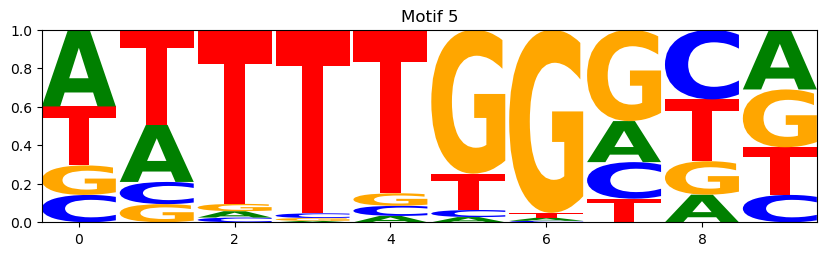

...

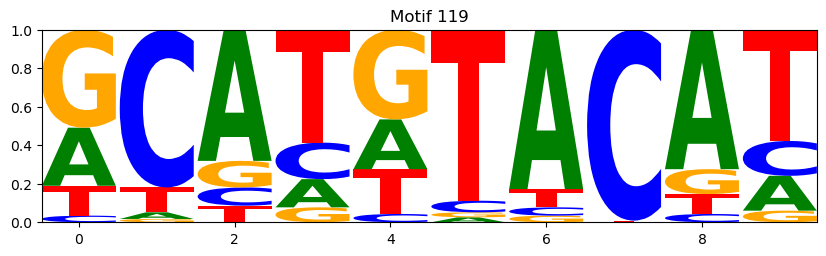

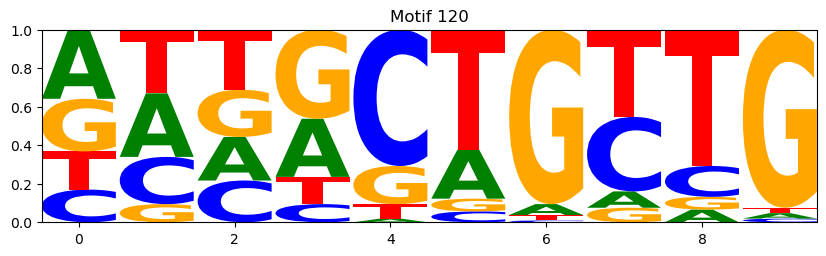

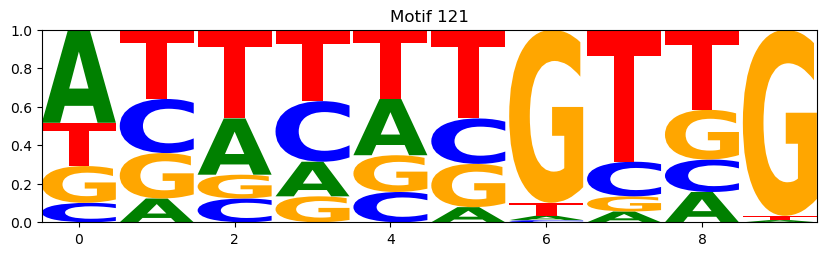

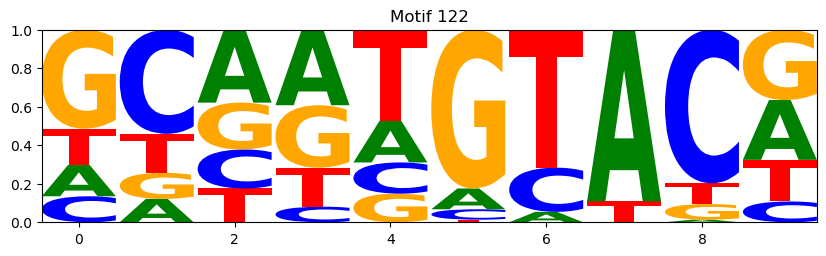

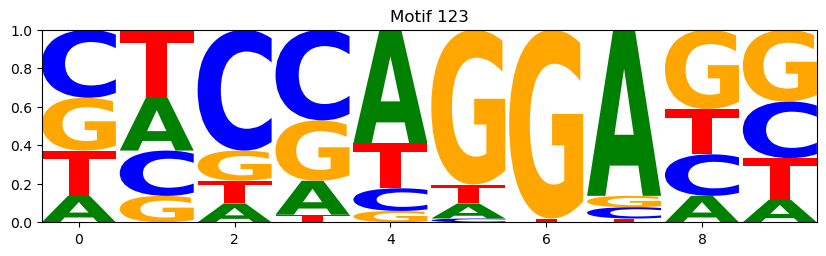

In [43]:
for i, motif_df in enumerate(motifs):
    logo = logomaker.Logo(motif_df, font_name='Arial')
    plt.title(f'Motif {i+1}')
    plt.show()